![](/home/dm/Desktop/diamond/img/d.png)

This document explores a dataset containing prices and attributes for approximately 54,000 round-cut diamonds. <br>
There are 53,940 diamonds in the dataset with 10 features (carat, cut, color, clarity, depth, table, price, x, y, and z).<br> Most variables are numeric in nature, but the variables cut, color, and clarity are ordered factor variables.


### IMPORTING LIBRARIES


In [1]:
import pandas as pd # data processing, CSV file I/O (excel & text)
import seaborn as sns # visualizations
import plotly.express as px # visualizations
import plotly.graph_objects as go # visualizations
import numpy as np # linear algebra
import matplotlib as mpl # ploting
import matplotlib.pyplot as plt # ploting

In [2]:
diamond = pd.read_csv('diamonds.csv') # read data from diamonds.csv

In [3]:
diamond.head() # show first 5 rows

,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
0,1,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,2,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,3,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,4,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,5,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [4]:
diamond = diamond.drop(['Unnamed: 0'], axis=1) # drop Unnamed: 0	column

### CHECKING NULL VALUES

<AxesSubplot:>

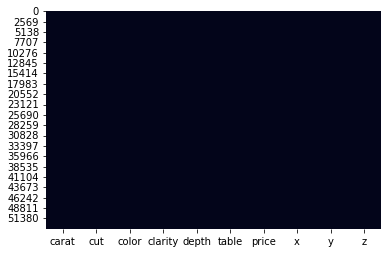

In [5]:
sns.heatmap(diamond.isnull(), cbar=False) # heatmap of null values

## EDA START : 

In [6]:
diamond.shape # shape of data

(53943, 10)

In [7]:
diamond.info() # information about data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53943 entries, 0 to 53942
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    53943 non-null  float64
 1   cut      53943 non-null  object 
 2   color    53943 non-null  object 
 3   clarity  53943 non-null  object 
 4   depth    53943 non-null  float64
 5   table    53943 non-null  float64
 6   price    53943 non-null  int64  
 7   x        53943 non-null  float64
 8   y        53943 non-null  float64
 9   z        53943 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 4.1+ MB


In [8]:
diamond.describe() # describe data

,carat,depth,table,price,x,y,z
count,53943.000000,53943.000000,53943.000000,53943.000000,53943.000000,53943.000000,53943.000000
mean,0.797935,61.749322,57.457251,3932.734294,5.731158,5.734526,3.538730
std,0.473999,1.432626,2.234549,3989.338447,1.121730,1.142103,0.705679
min,0.200000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,0.400000,61.000000,56.000000,950.000000,4.710000,4.720000,2.910000
50%,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,1.040000,62.500000,59.000000,5324.000000,6.540000,6.540000,4.040000
max,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


In [9]:
diamond.groupby('cut').count() # count number of rows in each category

,carat,color,clarity,depth,table,price,x,y,z
cut,,,,,,,,,
Fair,1610,1610,1610,1610,1610,1610,1610,1610,1610
Good,4906,4906,4906,4906,4906,4906,4906,4906,4906
Ideal,21551,21551,21551,21551,21551,21551,21551,21551,21551
Premium,13793,13793,13793,13793,13793,13793,13793,13793,13793
Very Good,12083,12083,12083,12083,12083,12083,12083,12083,12083


In [10]:
#Count each cut type
diamond.groupby('cut').size().sort_values(ascending=False)
#Plotting distribution of cut types
cut = diamond.groupby('cut').size().sort_values(ascending=False)
px.bar(cut, x=cut.index, y=cut.values, template='plotly_dark', title='Distribution of cut types')



In [11]:
px.pie(cut, values=cut.values, names=cut.index, title='Distribution of cut types', template='plotly_dark')

In [12]:
color = diamond.groupby('color').size().sort_values(ascending=False) # count number of rows in each category 
px.pie(color, values=color.values, names=color.index, title='Distribution of color types', template='plotly_dark')


In [13]:
clarification = diamond.groupby('clarity').size().sort_values(ascending=False) # count number of rows in each category
px.pie(clarification, values=clarification.values, names=clarification.index, title='Distribution of clarity types', template='plotly_dark')

In [14]:
#understanding price distribution
diamond.groupby('price').size().sort_values(ascending=False)


price
605      132
802      127
625      126
828      125
776      124
        ... 
9510       1
9507       1
9504       1
9503       1
18823      1
Length: 11602, dtype: int64

In [15]:
#price distribution plot
price = diamond.groupby('price').size().sort_values(ascending=False)
px.line(price, x=price.index, y=price.values, template='plotly_dark', title='Distribution of price')

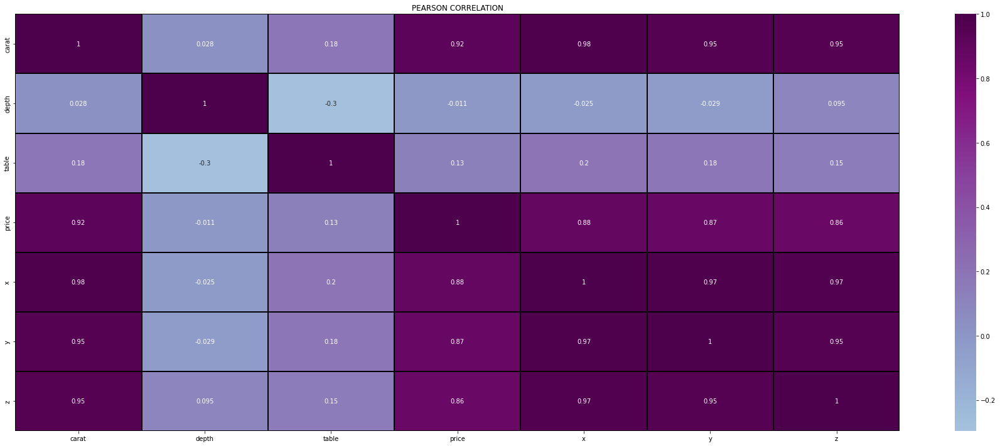

In [16]:

pearson = diamond.corr(method="pearson")
spearman = diamond.corr(method="spearman")

figure = plt.figure(figsize=(25,10))

sns.heatmap(pearson,annot=True,center=0,linewidths=2,linecolor="black",cmap="BuPu")

plt.title("PEARSON CORRELATION")
plt.tight_layout()
plt.show()


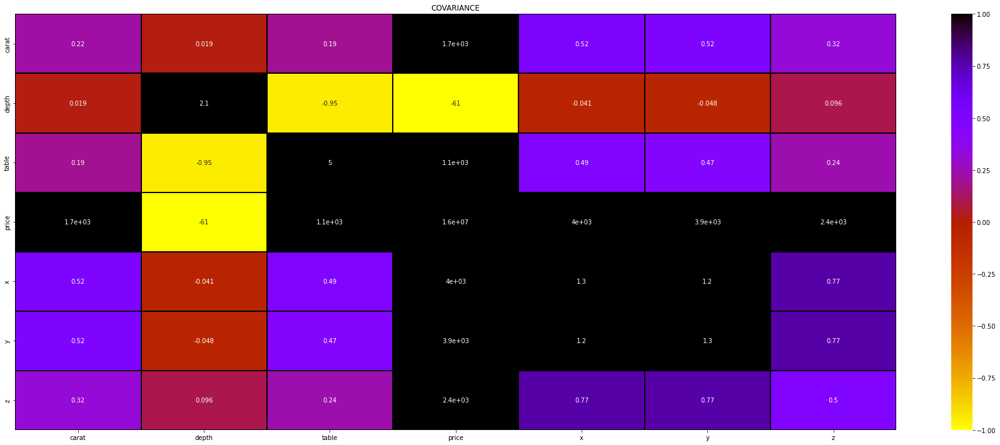

In [17]:
cova = diamond.cov()

figure = plt.figure(figsize=(25,10))

sns.heatmap(cova,annot=True,vmin=-1,center=0,vmax=1,linewidths=2,linecolor="black",cmap="gnuplot_r")
plt.title("COVARIANCE")
plt.tight_layout()
plt.show()

In [18]:
#plot correlation between price and carat
px.scatter(diamond, x='price', y='carat', size='depth', color='cut', template='plotly_dark', title='Price vs Carat')


In [19]:
#distribution of carat vs quality
px.violin(diamond, x='cut', y='carat', template='plotly_dark', title='Price by cut type')

In [20]:
px.scatter_matrix(diamond, template='plotly_dark', title='Scatter Matrix', size='depth', color='cut', hover_data=['carat', 'depth', 'price'], width=1400, height=800)

In [21]:
#¿how many diamonds are there in each cut?
diamond.cut.value_counts()


Ideal        21551
Premium      13793
Very Good    12083
Good          4906
Fair          1610
Name: cut, dtype: int64

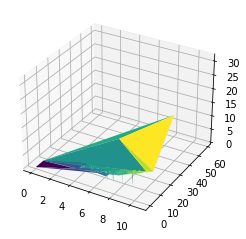

In [22]:
#the mostly diamon form 


ax = plt.axes(projection='3d')
ax.plot_trisurf(diamond.x, diamond.y, diamond.z, cmap='viridis', edgecolor='none')


In [24]:
diamond.columns

Index(['carat', 'cut', 'color', 'clarity', 'depth', 'table', 'price', 'x', 'y',
       'z'],
      dtype='object')

In [25]:
diamond.dtypes

carat      float64
cut         object
color       object
clarity     object
depth      float64
table      float64
price        int64
x          float64
y          float64
z          float64
dtype: object

## MACHINE LEARNING

In [23]:
from pycaret.regression import * # import pycaret regression module for regression analysis and model selection with backend to predict price and carat 

#### Set Up first model with target objetive : price 

In [26]:
reg = setup(data = diamond, target = 'price',  session_id = 123,  normalize = True, polynomial_features = True, trigonometry_features = True, feature_interaction=True)


,Description,Value
0,session_id,123
1,Target,price
2,Original Data,"(53943, 10)"
3,Missing Values,False
4,Numeric Features,6
5,Categorical Features,3
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(37760, 53)"


#### Model`s Score table

In [27]:
best = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
catboost,CatBoost Regressor,282.6914,294330.7738,542.0417,0.9815,0.1078,0.0785,14.9530
lightgbm,Light Gradient Boosting Machine,292.9320,308912.2600,555.3674,0.9805,0.1119,0.0858,0.2730
rf,Random Forest Regressor,278.9085,314214.7022,560.0907,0.9802,0.0952,0.0685,8.3070
et,Extra Trees Regressor,277.6928,318128.3248,563.6684,0.9800,0.0946,0.0671,7.1730
xgboost,Extreme Gradient Boosting,294.4516,320120.8107,565.5139,0.9798,0.1089,0.0791,1.3980
gbr,Gradient Boosting Regressor,403.0033,533102.0368,729.9624,0.9664,0.1898,0.1269,2.4200
dt,Decision Tree Regressor,375.0164,594723.4290,770.6419,0.9625,0.1313,0.0906,0.1640
knn,K Neighbors Regressor,406.5989,719450.5109,846.9539,0.9547,0.1454,0.1071,0.4540
omp,Orthogonal Matching Pursuit,760.6824,1470549.7299,1212.4643,0.9073,0.4048,0.3395,0.0150
llar,Lasso Least Angle Regression,730.9143,1673736.5639,1293.6017,0.8945,0.3053,0.2196,0.0260


In [28]:
catboost = create_model("catboost")

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,280.7779,291322.2974,539.7428,0.9809,0.1028,0.0768
1,280.8848,281607.3348,530.6669,0.9828,0.1030,0.0780
2,283.4866,290655.8126,539.1250,0.9813,0.1045,0.0796
3,293.7857,321319.1829,566.8502,0.9809,0.1042,0.0790
4,282.0898,278648.4454,527.8716,0.9830,0.1103,0.0788
5,292.9041,320621.5013,566.2345,0.9794,0.1212,0.0788
6,291.4416,331086.3547,575.4010,0.9794,0.1098,0.0800
7,284.3002,311463.9757,558.0896,0.9804,0.1118,0.0787
8,266.1223,260848.9020,510.7337,0.9830,0.1053,0.0778


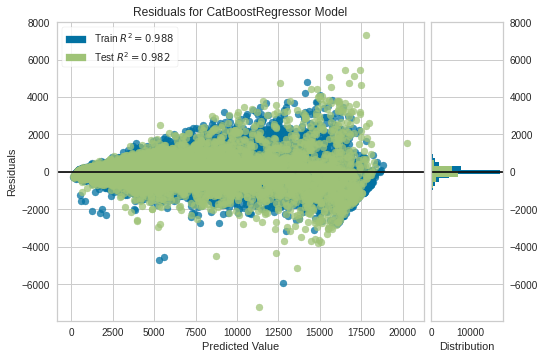

In [29]:
plot_model(catboost)


In [30]:
tuned_cat = tune_model(catboost)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,300.3618,332186.1757,576.3559,0.9783,0.1167,0.0871
1,298.8905,303161.2771,550.6008,0.9815,0.1190,0.0890
2,297.5619,307893.7371,554.8817,0.9802,0.1190,0.0889
3,310.6728,341288.5248,584.1990,0.9797,0.1169,0.0876
4,298.6925,301798.4424,549.3619,0.9816,0.1299,0.0894
5,315.2820,361035.1805,600.8620,0.9768,0.1294,0.0913
6,317.3526,377921.7743,614.7534,0.9765,0.1295,0.0940
7,303.5701,328691.0947,573.3159,0.9793,0.1207,0.0883
8,285.4831,281427.2839,530.4972,0.9817,0.1165,0.0876


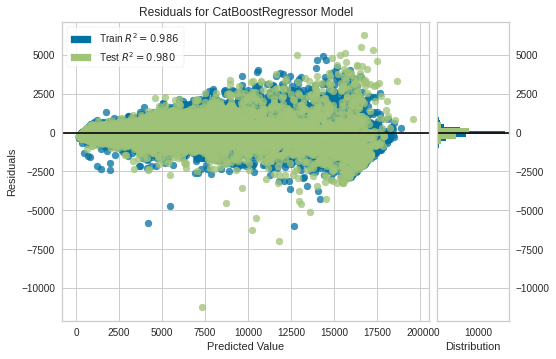

In [31]:
plot_model(tuned_cat)

In [33]:
finalize_model(tuned_cat)

In [36]:
save_model(tuned_cat, "diamond_model")

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[], target='price',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric_strategy='...
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'),
                 ('dfs',
                  DFS_Classic(interactions=['multiply'], ml_usecase='regression',
                              n_jobs=-1, random_state=123, subclass='

#### Second target, Carat 

In [44]:
reg_quality = setup(data = diamond, target = 'carat',  session_id = 123,  normalize = True, polynomial_features = True, trigonometry_features = True, feature_interaction=True)


,Description,Value
0,session_id,123
1,Target,carat
2,Original Data,"(53943, 10)"
3,Missing Values,False
4,Numeric Features,6
5,Categorical Features,3
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(37760, 50)"


In [45]:
catboost_quality = create_model("catboost")

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0083,0.0004,0.0200,0.9981,0.0092,0.0106
1,0.0078,0.0002,0.0130,0.9993,0.0057,0.0101
2,0.0078,0.0002,0.0142,0.9991,0.0065,0.0100
3,0.0082,0.0005,0.0216,0.9980,0.0089,0.0102
4,0.0078,0.0002,0.0150,0.9990,0.0073,0.0103
5,0.0081,0.0003,0.0176,0.9986,0.0072,0.0104
6,0.0081,0.0004,0.0193,0.9984,0.0086,0.0103
7,0.0078,0.0002,0.0133,0.9992,0.0065,0.0102
8,0.0076,0.0002,0.0132,0.9992,0.0062,0.0101


In [46]:
tuned_cat_quality = tune_model(catboost)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,0.0103,0.0007,0.0257,0.9969,0.0108,0.0135
1,0.0091,0.0003,0.0166,0.9988,0.0069,0.0120
2,0.0099,0.0004,0.0204,0.9981,0.0083,0.0130
3,0.0092,0.0005,0.0220,0.9980,0.0091,0.0117
4,0.0090,0.0003,0.0166,0.9988,0.0081,0.0120
5,0.0094,0.0005,0.0218,0.9979,0.0089,0.0121
6,0.0093,0.0006,0.0238,0.9975,0.0106,0.0122
7,0.0090,0.0002,0.0148,0.9990,0.0076,0.0122
8,0.0092,0.0003,0.0162,0.9988,0.0074,0.0123


In [47]:
finalize_model(tuned_cat_quality)

In [48]:
save_model(tuned_cat_quality, "diamond_model_quality")

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[], target='carat',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric_strategy='...
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'),
                 ('dfs',
                  DFS_Classic(interactions=['multiply'], ml_usecase='regression',
                              n_jobs=-1, random_state=123, subclass='